## Imports

In [35]:
import os
import glob
import random
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import time
import math
import requests
from io import BytesIO

# torchvision transforms functional for rotate, adjust_brightness, etc.
from torchvision.transforms import functional as TF  
from torchvision.transforms.functional import InterpolationMode

# torch.nn.functional for interpolate, conv, etc.
import torch.nn.functional as F


In [ ]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

## Dataset

In [ ]:
# Paths & constants
# ---------------------------

#download the dataset from Kaggle
#"https://www.kaggle.com/datasets/slyveinweeb/aerialsatellite-images-of-rooftops-with-labels\n"
# and place it under 'data/'"
BASE_DIR = "data/" # path to dataset
IMAGE_DIR = os.path.join(BASE_DIR, "/images","images")
MASK_DIR  = os.path.join(BASE_DIR, "/label", "label")

VAL_RATIO = 0.15
TEST_RATIO = 0.15
BATCH_SIZE = 8
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

In [10]:
# Pair images with masks
# ---------------------------
mask_dict = {}
for mask_path in glob.glob(os.path.join(MASK_DIR, "*.tif")):
    mask_name = os.path.basename(mask_path).replace("_label.tif", "")
    mask_dict[mask_name] = mask_path

image_files = []
mask_files = []

for img_path in glob.glob(os.path.join(IMAGE_DIR, "*.tif")):
    img_name = os.path.basename(img_path).replace(".tif", "")
    if img_name in mask_dict:   
        image_files.append(img_path)
        mask_files.append(mask_dict[img_name])

print(f"Paired images: {len(image_files)}")

Paired images: 1671


In [11]:
# Train / Val / Test split
# ---------------------------
from sklearn.model_selection import train_test_split

train_imgs, test_imgs, train_masks, test_masks = train_test_split(
    image_files, mask_files, test_size=TEST_RATIO, random_state=42
)

train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    train_imgs, train_masks, test_size=VAL_RATIO / (1 - TEST_RATIO), random_state=42
)

print(f"Train: {len(train_imgs)}, Val: {len(val_imgs)}, Test: {len(test_imgs)}")

Train: 1169, Val: 251, Test: 251


In [12]:
# Tensor-based augmentation
# ---------------------------
class PairedAugment:
    def __init__(self, flip_prob=0.5, rotate_deg=15, color_jitter=True):
        self.flip_prob = flip_prob
        self.rotate_deg = rotate_deg
        self.color_jitter = color_jitter

    def __call__(self, img, mask):
        # Horizontal flip
        if random.random() < self.flip_prob:
            img = img.flip(-1)
            mask = mask.flip(-1)
        # Vertical flip
        if random.random() < self.flip_prob:
            img = img.flip(-2)
            mask = mask.flip(-2)
        # Rotation
        angle = random.uniform(-self.rotate_deg, self.rotate_deg)
        img = TF.rotate(img, angle)
        mask = TF.rotate(mask, angle, interpolation=InterpolationMode.NEAREST)

        # Color jitter only on image
        if self.color_jitter:
            brightness = random.uniform(0.8, 1.2)
            contrast   = random.uniform(0.8, 1.2)
            saturation = random.uniform(0.8, 1.2)
            img = TF.adjust_brightness(img, brightness)
            img = TF.adjust_contrast(img, contrast)
            img = TF.adjust_saturation(img, saturation)

        return img, mask


In [13]:
# Dataset class
# ---------------------------
class RoofDataset(Dataset):
    def __init__(self, image_files, mask_files, transform=None, filter_empty=True, imagenet_norm=False):
        self.image_files = []
        self.mask_files = []
        self.transform = transform
        self.imagenet_norm = imagenet_norm

        for img_path, mask_path in zip(image_files, mask_files):
            mask = np.array(Image.open(mask_path))
            if filter_empty and mask.sum() == 0:
                continue
            self.image_files.append(img_path)
            self.mask_files.append(mask_path)

        # ImageNet mean/std as tensors
        if self.imagenet_norm:
            self.mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
            self.std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img = np.array(Image.open(self.image_files[idx])).astype(np.float32)/255.0
        mask = np.array(Image.open(self.mask_files[idx])).astype(np.float32)/255.0

        img = torch.from_numpy(img).permute(2,0,1)  # C,H,W
        mask = torch.from_numpy(mask).unsqueeze(0)  # 1,H,W

        if self.transform:
            img, mask = self.transform(img, mask)

        if self.imagenet_norm:
            img = (img - self.mean) / self.std

        return img, mask

In [14]:
#Create datasets and loaders
# ---------------------------

train_dataset = RoofDataset(train_imgs, train_masks, transform=PairedAugment(), imagenet_norm=True)
val_dataset   = RoofDataset(val_imgs, val_masks, transform=None, imagenet_norm=True)
test_dataset  = RoofDataset(test_imgs, test_masks, transform=None, imagenet_norm=True)


train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

print("DataLoaders ready!")


DataLoaders ready!


## Dice metric

In [16]:
@torch.no_grad()
def dice_coef_thresh(logits, targets, threshold=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()
    preds = preds.view(-1)
    targets = targets.view(-1)
    intersection = (preds * targets).sum()
    return (2 * intersection + eps) / (preds.sum() + targets.sum() + eps)


def find_best_threshold(model, val_loader, thresholds=[0.4,0.45,0.5,0.55], device=device):
    model.eval()
    best_thresh = thresholds[0]
    best_dice = 0.0

    for thresh in thresholds:
        dices = []
        for imgs, masks in val_loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            logits = model(imgs)
            dices.append(dice_coef_thresh(logits, masks, threshold=thresh).item())

        avg_dice = sum(dices)/len(dices)
        if avg_dice > best_dice:
            best_dice = avg_dice
            best_thresh = thresh

    return best_thresh, best_dice


## Model Training

In [ ]:
# Model
# ---------------------------
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None
).to(device)

In [ ]:
# Loss 
# ---------------------------
class BCEDiceLoss(nn.Module): #combined BCE + Dice loss
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, logits, targets):
        bce = self.bce(logits, targets)
        probs = torch.sigmoid(logits)
        smooth = 1e-6
        intersection = (probs * targets).sum(dim=(1,2,3))
        union = probs.sum(dim=(1,2,3)) + targets.sum(dim=(1,2,3))
        dice = (2*intersection + smooth) / (union + smooth)
        dice_loss = 1 - dice.mean()
        return 0.4 * bce + 0.6 * dice_loss

criterion = BCEDiceLoss()

In [ ]:
# Freeze encoder
# ---------------------------
for param in model.encoder.parameters():
    param.requires_grad = False


encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters()) + list(model.segmentation_head.parameters())

In [ ]:
# Optimizer with different LR for encoder and decoder
# ---------------------------
optimizer = torch.optim.Adam([
    {'params': encoder_params, 'lr': 1e-5},
    {'params': decoder_params, 'lr': 1e-4}
], weight_decay=1e-5)

# Scheduler
# ---------------------------
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=2
)

In [ ]:
# Dice coefficient
# ---------------------------
def dice_coef(preds, targets, epsilon=1e-6):
    preds = torch.sigmoid(preds)
    preds_flat = preds.view(-1)
    targets_flat = targets.view(-1)
    intersection = (preds_flat * targets_flat).sum()
    return (2.*intersection + epsilon) / (preds_flat.sum() + targets_flat.sum() + epsilon)

@torch.no_grad()
def dice_coef_thresh(logits, targets, threshold=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()
    preds = preds.view(-1)
    targets = targets.view(-1)
    intersection = (preds * targets).sum()
    return (2 * intersection + eps) / (preds.sum() + targets.sum() + eps)


def find_best_threshold(model, val_loader, thresholds=[0.4,0.45,0.5,0.55], device=device):
    model.eval()
    best_thresh = thresholds[0]
    best_dice = 0.0

    for thresh in thresholds:
        dices = []
        for imgs, masks in val_loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            logits = model(imgs)
            dices.append(dice_coef_thresh(logits, masks, threshold=thresh).item())

        avg_dice = sum(dices)/len(dices)
        if avg_dice > best_dice:
            best_dice = avg_dice
            best_thresh = thresh

    return best_thresh, best_dice

In [ ]:
#  Training loop
# ---------------------------
NUM_EPOCHS = 50
patience = 5
best_val_dice = 0.0
epochs_no_improve = 0
save_path = "models/best_model.pth"

for epoch in range(NUM_EPOCHS):

    # Gradual unfreeze
    if epoch < 5:
        for param in model.encoder.parameters():
            param.requires_grad = False
    else:
        for param in model.encoder.parameters():
            param.requires_grad = True
        # Freeze BatchNorm stats in encoder after unfreeze
        for m in model.encoder.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()

    # ---- Training ----
    model.train()
    train_loss = 0.0
    train_dice = 0.0

    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}", ncols=100, leave=True)

    for imgs, masks in loop:
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_dice += dice_coef(outputs, masks).item()


    train_loss /= len(train_loader)
    train_dice /= len(train_loader)

    # ---- Validation ----
    model.eval()
    val_loss = 0.0
    val_dice = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, masks)
            val_loss += loss.item()
            val_dice += dice_coef(outputs, masks).item()

    val_loss /= len(val_loader)
    val_dice /= len(val_loader)

    # ---- Logs ----
    print(f"\nEpoch {epoch+1}: "
          f"Train Loss={train_loss:.4f}, Train Dice={train_dice:.4f}, "
          f"Val Loss={val_loss:.4f}, Val Dice={val_dice:.4f}", flush=True)
    # Step scheduler based on validation Dice
    scheduler.step(val_dice)

    # ---- Early stopping by val Dice ----
    if val_dice > best_val_dice:
        best_val_dice = val_dice
        epochs_no_improve = 0
        torch.save(model.state_dict(), save_path)
        print(f"Validation Dice improved! Model saved to {save_path}", flush=True)
    else:
        epochs_no_improve += 1
        print(f"No improvement for {epochs_no_improve} epochs.", flush=True)

    if epochs_no_improve >= patience:
        print(f"Early stopping triggered after {epoch+1} epochs.", flush=True)
        break

print(f"Training finished. Best validation Dice: {best_val_dice:.4f}")


Epoch 1/50: 100%|█████████████████████████████████| 79/79 [00:31<00:00,  2.52it/s, batch_loss=0.651]



Epoch 1: Train Loss=0.5498, Train Dice=0.4767, Val Loss=0.4678, Val Dice=0.5519
Validation Dice improved! Model saved to best_model.pth


Epoch 2/50: 100%|█████████████████████████████████| 79/79 [00:29<00:00,  2.69it/s, batch_loss=0.317]



Epoch 2: Train Loss=0.4355, Train Dice=0.5734, Val Loss=0.4268, Val Dice=0.5970
Validation Dice improved! Model saved to best_model.pth


Epoch 3/50: 100%|█████████████████████████████████| 79/79 [00:30<00:00,  2.63it/s, batch_loss=0.281]



Epoch 3: Train Loss=0.3909, Train Dice=0.6180, Val Loss=0.3433, Val Dice=0.6626
Validation Dice improved! Model saved to best_model.pth


Epoch 4/50: 100%|█████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, batch_loss=0.291]



Epoch 4: Train Loss=0.3506, Train Dice=0.6646, Val Loss=0.3108, Val Dice=0.6865
Validation Dice improved! Model saved to best_model.pth


Epoch 5/50: 100%|█████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, batch_loss=0.428]



Epoch 5: Train Loss=0.3138, Train Dice=0.7069, Val Loss=0.2846, Val Dice=0.7362
Validation Dice improved! Model saved to best_model.pth


Epoch 6/50: 100%|█████████████████████████████████| 79/79 [00:50<00:00,  1.57it/s, batch_loss=0.388]



Epoch 6: Train Loss=0.2788, Train Dice=0.7503, Val Loss=0.2346, Val Dice=0.7830
Validation Dice improved! Model saved to best_model.pth


Epoch 7/50: 100%|█████████████████████████████████| 79/79 [00:51<00:00,  1.53it/s, batch_loss=0.304]



Epoch 7: Train Loss=0.2539, Train Dice=0.7792, Val Loss=0.2241, Val Dice=0.7998
Validation Dice improved! Model saved to best_model.pth


Epoch 8/50: 100%|█████████████████████████████████| 79/79 [00:51<00:00,  1.53it/s, batch_loss=0.391]



Epoch 8: Train Loss=0.2370, Train Dice=0.7937, Val Loss=0.2002, Val Dice=0.8194
Validation Dice improved! Model saved to best_model.pth


Epoch 9/50: 100%|█████████████████████████████████| 79/79 [00:51<00:00,  1.54it/s, batch_loss=0.503]



Epoch 9: Train Loss=0.2129, Train Dice=0.8226, Val Loss=0.1774, Val Dice=0.8483
Validation Dice improved! Model saved to best_model.pth


Epoch 10/50: 100%|████████████████████████████████| 79/79 [00:52<00:00,  1.51it/s, batch_loss=0.172]



Epoch 10: Train Loss=0.1974, Train Dice=0.8383, Val Loss=0.1700, Val Dice=0.8518
Validation Dice improved! Model saved to best_model.pth


Epoch 11/50: 100%|████████████████████████████████| 79/79 [00:52<00:00,  1.50it/s, batch_loss=0.117]



Epoch 11: Train Loss=0.1896, Train Dice=0.8498, Val Loss=0.1606, Val Dice=0.8636
Validation Dice improved! Model saved to best_model.pth


Epoch 12/50: 100%|████████████████████████████████| 79/79 [00:53<00:00,  1.47it/s, batch_loss=0.285]



Epoch 12: Train Loss=0.1829, Train Dice=0.8584, Val Loss=0.1532, Val Dice=0.8706
Validation Dice improved! Model saved to best_model.pth


Epoch 13/50: 100%|████████████████████████████████| 79/79 [00:54<00:00,  1.44it/s, batch_loss=0.234]



Epoch 13: Train Loss=0.1686, Train Dice=0.8695, Val Loss=0.1424, Val Dice=0.8826
Validation Dice improved! Model saved to best_model.pth


Epoch 14/50: 100%|███████████████████████████████| 79/79 [00:55<00:00,  1.43it/s, batch_loss=0.0513]



Epoch 14: Train Loss=0.1605, Train Dice=0.8772, Val Loss=0.1448, Val Dice=0.8816
No improvement for 1 epochs.


Epoch 15/50: 100%|████████████████████████████████| 79/79 [00:55<00:00,  1.43it/s, batch_loss=0.125]



Epoch 15: Train Loss=0.1575, Train Dice=0.8781, Val Loss=0.1492, Val Dice=0.8754
No improvement for 2 epochs.


Epoch 16/50: 100%|███████████████████████████████| 79/79 [00:55<00:00,  1.42it/s, batch_loss=0.0998]



Epoch 16: Train Loss=0.1515, Train Dice=0.8854, Val Loss=0.1358, Val Dice=0.8888
Validation Dice improved! Model saved to best_model.pth


Epoch 17/50: 100%|█████████████████████████████████| 79/79 [00:55<00:00,  1.41it/s, batch_loss=0.19]



Epoch 17: Train Loss=0.1427, Train Dice=0.8941, Val Loss=0.1291, Val Dice=0.8991
Validation Dice improved! Model saved to best_model.pth


Epoch 18/50: 100%|███████████████████████████████| 79/79 [00:56<00:00,  1.40it/s, batch_loss=0.0693]



Epoch 18: Train Loss=0.1407, Train Dice=0.8978, Val Loss=0.1279, Val Dice=0.8986
No improvement for 1 epochs.


Epoch 19/50: 100%|████████████████████████████████| 79/79 [00:57<00:00,  1.37it/s, batch_loss=0.224]



Epoch 19: Train Loss=0.1327, Train Dice=0.9016, Val Loss=0.1294, Val Dice=0.8955
No improvement for 2 epochs.


Epoch 20/50: 100%|███████████████████████████████| 79/79 [00:56<00:00,  1.40it/s, batch_loss=0.0671]



Epoch 20: Train Loss=0.1278, Train Dice=0.9082, Val Loss=0.1241, Val Dice=0.9024
Validation Dice improved! Model saved to best_model.pth


Epoch 21/50: 100%|███████████████████████████████| 79/79 [00:56<00:00,  1.41it/s, batch_loss=0.0585]



Epoch 21: Train Loss=0.1281, Train Dice=0.9090, Val Loss=0.1245, Val Dice=0.9032
Validation Dice improved! Model saved to best_model.pth


Epoch 22/50: 100%|████████████████████████████████| 79/79 [00:57<00:00,  1.38it/s, batch_loss=0.218]



Epoch 22: Train Loss=0.1255, Train Dice=0.9141, Val Loss=0.1179, Val Dice=0.9027
No improvement for 1 epochs.


Epoch 23/50: 100%|███████████████████████████████| 79/79 [00:56<00:00,  1.39it/s, batch_loss=0.0865]



Epoch 23: Train Loss=0.1212, Train Dice=0.9161, Val Loss=0.1162, Val Dice=0.9069
Validation Dice improved! Model saved to best_model.pth


Epoch 24/50: 100%|████████████████████████████████| 79/79 [00:57<00:00,  1.38it/s, batch_loss=0.145]



Epoch 24: Train Loss=0.1216, Train Dice=0.9165, Val Loss=0.1180, Val Dice=0.9064
No improvement for 1 epochs.


Epoch 25/50: 100%|█████████████████████████████████| 79/79 [00:57<00:00,  1.38it/s, batch_loss=0.11]



Epoch 25: Train Loss=0.1139, Train Dice=0.9194, Val Loss=0.1194, Val Dice=0.9100
Validation Dice improved! Model saved to best_model.pth


Epoch 26/50: 100%|████████████████████████████████| 79/79 [00:59<00:00,  1.34it/s, batch_loss=0.364]



Epoch 26: Train Loss=0.1167, Train Dice=0.9213, Val Loss=0.1144, Val Dice=0.9102
Validation Dice improved! Model saved to best_model.pth


Epoch 27/50: 100%|███████████████████████████████| 79/79 [01:00<00:00,  1.30it/s, batch_loss=0.0472]



Epoch 27: Train Loss=0.1138, Train Dice=0.9214, Val Loss=0.1203, Val Dice=0.9049
No improvement for 1 epochs.


Epoch 28/50: 100%|███████████████████████████████| 79/79 [01:03<00:00,  1.25it/s, batch_loss=0.0923]



Epoch 28: Train Loss=0.1117, Train Dice=0.9243, Val Loss=0.1127, Val Dice=0.9113
Validation Dice improved! Model saved to best_model.pth


Epoch 29/50: 100%|████████████████████████████████| 79/79 [00:58<00:00,  1.35it/s, batch_loss=0.419]



Epoch 29: Train Loss=0.1112, Train Dice=0.9245, Val Loss=0.1148, Val Dice=0.9121
Validation Dice improved! Model saved to best_model.pth


Epoch 30/50: 100%|███████████████████████████████| 79/79 [00:58<00:00,  1.36it/s, batch_loss=0.0595]



Epoch 30: Train Loss=0.1044, Train Dice=0.9289, Val Loss=0.1167, Val Dice=0.9114
No improvement for 1 epochs.


Epoch 31/50: 100%|████████████████████████████████| 79/79 [00:58<00:00,  1.35it/s, batch_loss=0.262]



Epoch 31: Train Loss=0.1110, Train Dice=0.9240, Val Loss=0.1192, Val Dice=0.9083
No improvement for 2 epochs.


Epoch 32/50: 100%|███████████████████████████████| 79/79 [00:58<00:00,  1.35it/s, batch_loss=0.0852]



Epoch 32: Train Loss=0.1085, Train Dice=0.9252, Val Loss=0.1109, Val Dice=0.9132
Validation Dice improved! Model saved to best_model.pth


Epoch 33/50: 100%|███████████████████████████████| 79/79 [00:58<00:00,  1.35it/s, batch_loss=0.0716]



Epoch 33: Train Loss=0.1003, Train Dice=0.9312, Val Loss=0.1137, Val Dice=0.9129
No improvement for 1 epochs.


Epoch 34/50: 100%|████████████████████████████████| 79/79 [00:58<00:00,  1.35it/s, batch_loss=0.154]



Epoch 34: Train Loss=0.1021, Train Dice=0.9297, Val Loss=0.1130, Val Dice=0.9152
Validation Dice improved! Model saved to best_model.pth


Epoch 35/50: 100%|███████████████████████████████| 79/79 [00:59<00:00,  1.33it/s, batch_loss=0.0399]



Epoch 35: Train Loss=0.1050, Train Dice=0.9302, Val Loss=0.1163, Val Dice=0.9119
No improvement for 1 epochs.


Epoch 36/50: 100%|███████████████████████████████| 79/79 [01:01<00:00,  1.28it/s, batch_loss=0.0681]



Epoch 36: Train Loss=0.0989, Train Dice=0.9332, Val Loss=0.1153, Val Dice=0.9136
No improvement for 2 epochs.


Epoch 37/50: 100%|███████████████████████████████| 79/79 [01:00<00:00,  1.32it/s, batch_loss=0.0447]



Epoch 37: Train Loss=0.0955, Train Dice=0.9334, Val Loss=0.1131, Val Dice=0.9129
No improvement for 3 epochs.


Epoch 38/50: 100%|███████████████████████████████| 79/79 [00:59<00:00,  1.32it/s, batch_loss=0.0769]



Epoch 38: Train Loss=0.0937, Train Dice=0.9357, Val Loss=0.1098, Val Dice=0.9148
No improvement for 4 epochs.


Epoch 39/50: 100%|███████████████████████████████| 79/79 [00:59<00:00,  1.32it/s, batch_loss=0.0753]



Epoch 39: Train Loss=0.0929, Train Dice=0.9376, Val Loss=0.1095, Val Dice=0.9169
Validation Dice improved! Model saved to best_model.pth


Epoch 40/50: 100%|████████████████████████████████| 79/79 [00:59<00:00,  1.33it/s, batch_loss=0.036]



Epoch 40: Train Loss=0.0909, Train Dice=0.9390, Val Loss=0.1100, Val Dice=0.9154
No improvement for 1 epochs.


Epoch 41/50: 100%|████████████████████████████████| 79/79 [00:59<00:00,  1.33it/s, batch_loss=0.592]



Epoch 41: Train Loss=0.0975, Train Dice=0.9318, Val Loss=0.1118, Val Dice=0.9123
No improvement for 2 epochs.


Epoch 42/50: 100%|████████████████████████████████| 79/79 [00:59<00:00,  1.32it/s, batch_loss=0.115]



Epoch 42: Train Loss=0.0948, Train Dice=0.9374, Val Loss=0.1119, Val Dice=0.9146
No improvement for 3 epochs.


Epoch 43/50: 100%|███████████████████████████████| 79/79 [00:59<00:00,  1.32it/s, batch_loss=0.0873]



Epoch 43: Train Loss=0.0890, Train Dice=0.9386, Val Loss=0.1099, Val Dice=0.9165
No improvement for 4 epochs.


Epoch 44/50: 100%|████████████████████████████████| 79/79 [00:59<00:00,  1.32it/s, batch_loss=0.137]



Epoch 44: Train Loss=0.0894, Train Dice=0.9394, Val Loss=0.1099, Val Dice=0.9166
No improvement for 5 epochs.
Early stopping triggered after 44 epochs.
Training finished. Best validation Dice: 0.9169


In [7]:
# Recreate the model architecture
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None
).to(device)
device = 'mps' if torch.backends.mps.is_available() else 'cpu'
model.to(device)

# Load the saved weights
checkpoint_path = "models/best_model.pth"
model.load_state_dict(torch.load(checkpoint_path, map_location=device))

# Put model in evaluation mode
model.eval();


## Predict, visualize, and compare metrics

In [18]:
@torch.no_grad()
def predict_grayscale_resized(model, loader, model_size=400, out_size=640):
    """
    Predict grayscale masks with input resizing for model and output resizing.
    
    Args:
        model      : trained PyTorch model
        loader     : DataLoader
        model_size : int, input size for model (training size)
        out_size   : int, output size desired (for your pipeline)
    
    Returns:
        Tensor of shape (N, 1, out_size, out_size) with probability values [0,1]
    """
    model.eval()
    all_probs = []

    for imgs, _ in loader:  # ignore masks if only prediction
        imgs = imgs.to(device)

        # 1. Resize input to model size
        imgs_resized = F.interpolate(imgs, size=(model_size, model_size), mode='bilinear', align_corners=False)

        # 2. Predict
        logits = model(imgs_resized)
        probs  = torch.sigmoid(logits)

        # 3. Resize prediction to desired output size
        probs_up = F.interpolate(probs, size=(out_size, out_size), mode='bilinear', align_corners=False)

        all_probs.append(probs_up.cpu())

    return torch.cat(all_probs, dim=0)  # (N, 1, out_size, out_size)

train_probs = predict_grayscale_resized(model, train_loader, model_size=400, out_size=640)
val_probs   = predict_grayscale_resized(model, val_loader, model_size=400, out_size=640)
test_probs  = predict_grayscale_resized(model, test_loader, model_size=400, out_size=640)

print(train_probs.shape)  # e.g., (N_train, 1, 640, 640)


torch.Size([626, 1, 640, 640])


In [22]:
@torch.no_grad()
def visualize_grayscale_overlay(model, dataset, idx, device, model_size=400, overlay=True):
    """
    Visualize input image, grayscale roof probability map, and optional overlay.
    
    Args:
        model: trained segmentation model
        dataset: Dataset object
        idx: index of sample to visualize
        device: torch device
        model_size: int, resize input for model
        overlay: if True, show overlay of prediction vs GT
    """
    model.eval()
    img, gt = dataset[idx]
    original_size = img.shape[1:]  # H x W
    img_input = F.interpolate(img.unsqueeze(0), size=(model_size, model_size), mode='bilinear', align_corners=False)
    img_input = img_input.to(device)

    # ---- Predict ----
    logits = model(img_input)
    prob = torch.sigmoid(logits)

    # ---- Upscale to original image size ----
    prob_up = F.interpolate(prob, size=original_size, mode='bilinear', align_corners=False)
    prob_up = prob_up.squeeze().cpu().numpy()
    gt_np = gt.squeeze().numpy()

    fig, axs = plt.subplots(1, 2 if not overlay else 3, figsize=(15, 5))

    # ---- Input image ----
    axs[0].imshow(img.permute(1, 2, 0).cpu())
    axs[0].set_title("Input Image")
    axs[0].axis("off")

    # ---- Grayscale probability map ----
    axs[1].imshow(prob_up, cmap="gray")
    axs[1].set_title("Predicted Roof Probability (grayscale)")
    axs[1].axis("off")

    # ---- Optional overlay ----
    if overlay:
        pred_binary = (prob_up > 0.5).astype(np.uint8)  # threshold only for visualization
        tp = (pred_binary == 1) & (gt_np == 1)
        fp = (pred_binary == 1) & (gt_np == 0)
        fn = (pred_binary == 0) & (gt_np == 1)

        overlay_img = np.zeros((*gt_np.shape, 3), dtype=np.float32)
        overlay_img[fn] = [0, 1, 0]   # green = missed roof
        overlay_img[fp] = [1, 0, 0]   # red = false roof
        overlay_img[tp] = [1, 1, 0]   # yellow = correct

        axs[2].imshow(img.permute(1, 2, 0).cpu())
        axs[2].imshow(overlay_img, alpha=0.6)
        axs[2].set_title("Overlay (TP=yellow, FN=green, FP=red)")
        axs[2].axis("off")

    plt.tight_layout()
    plt.show()



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


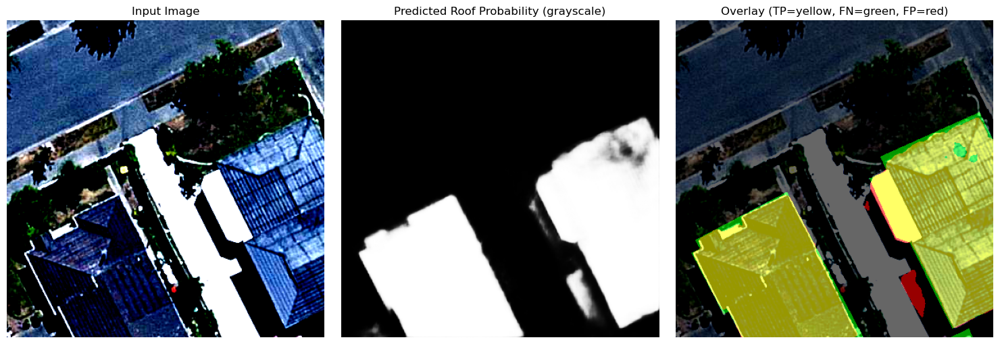

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


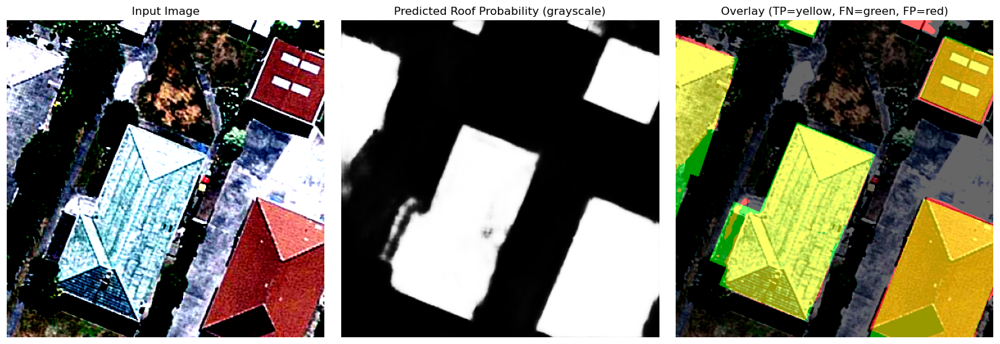

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


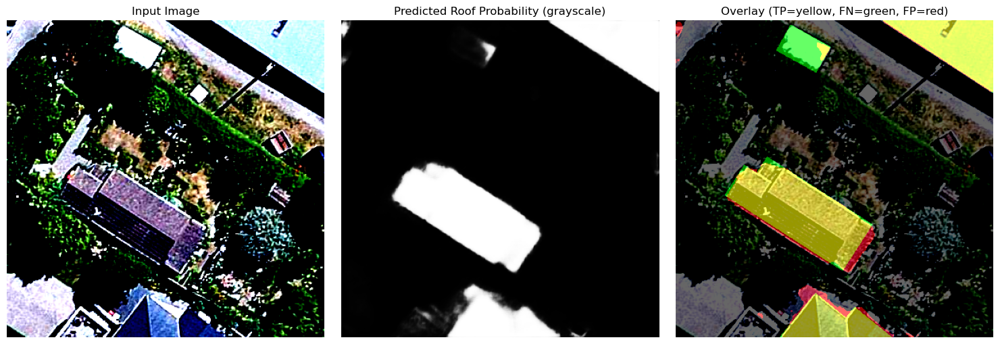

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


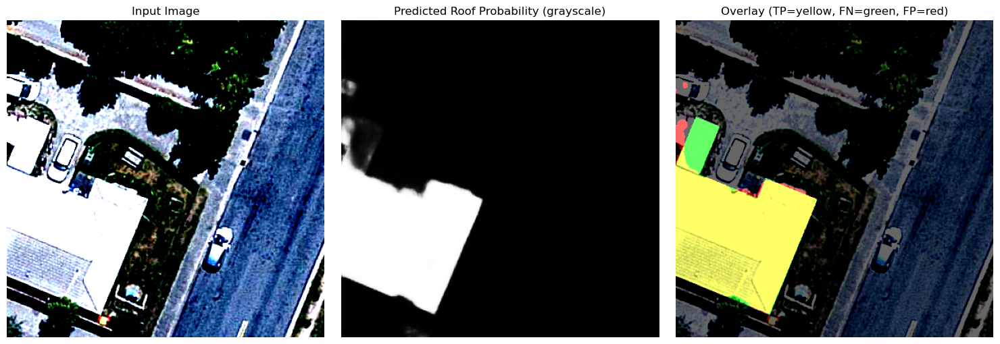

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


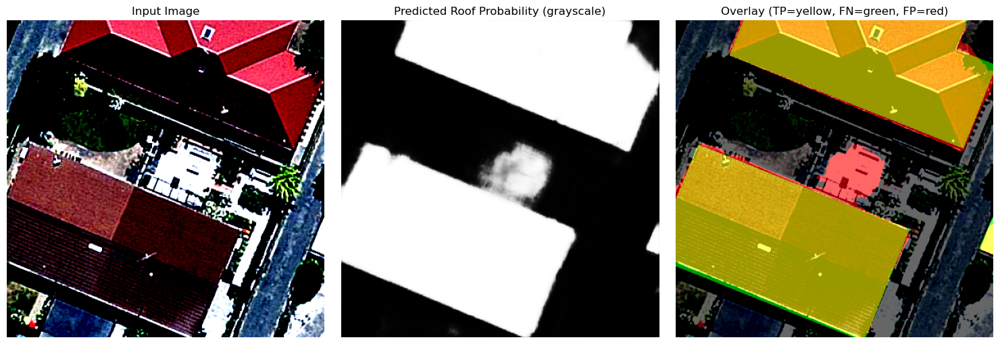

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


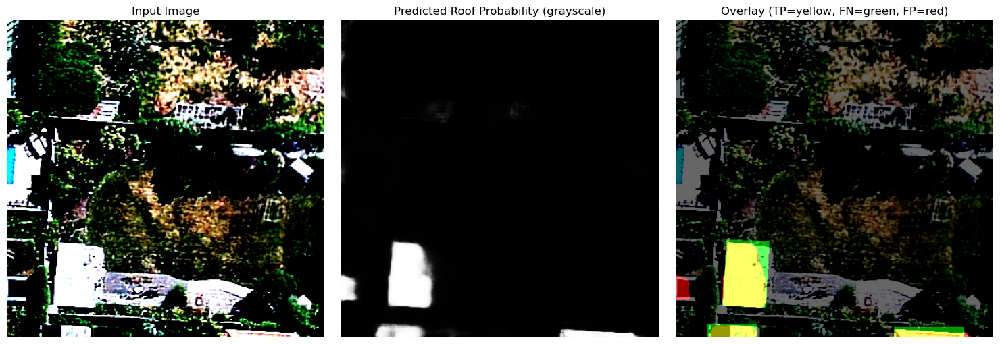

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


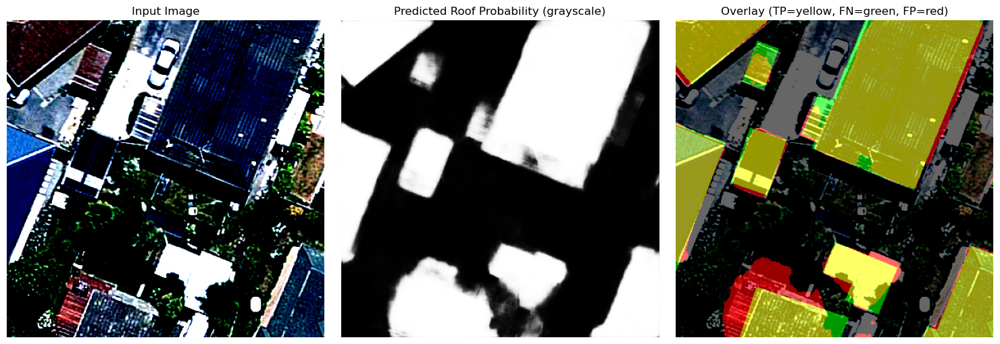

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


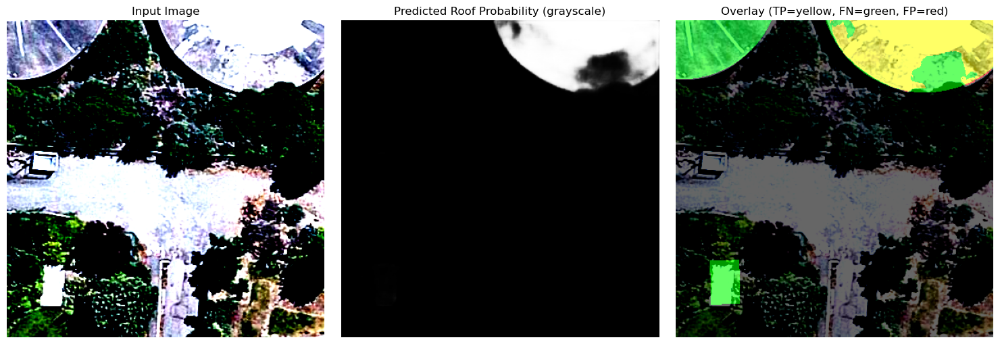

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


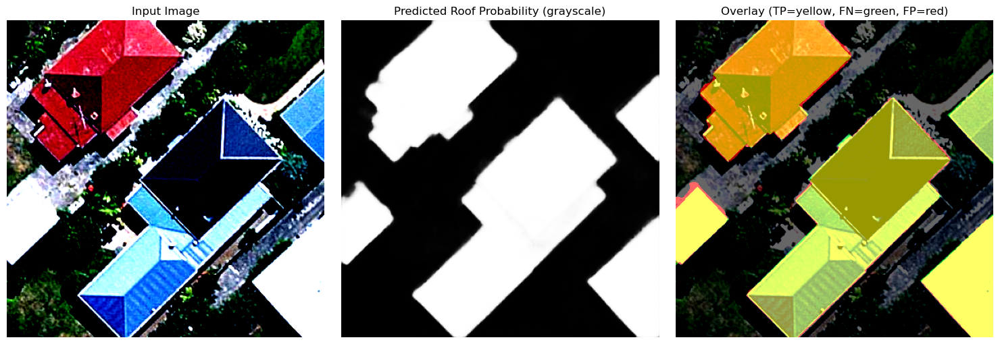

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


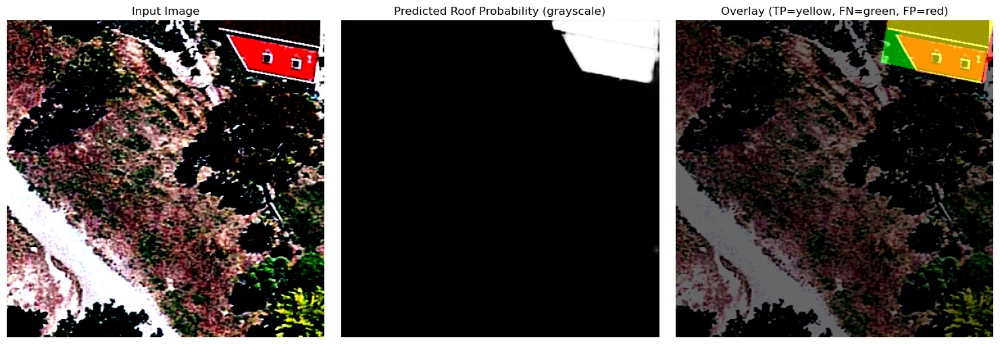

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


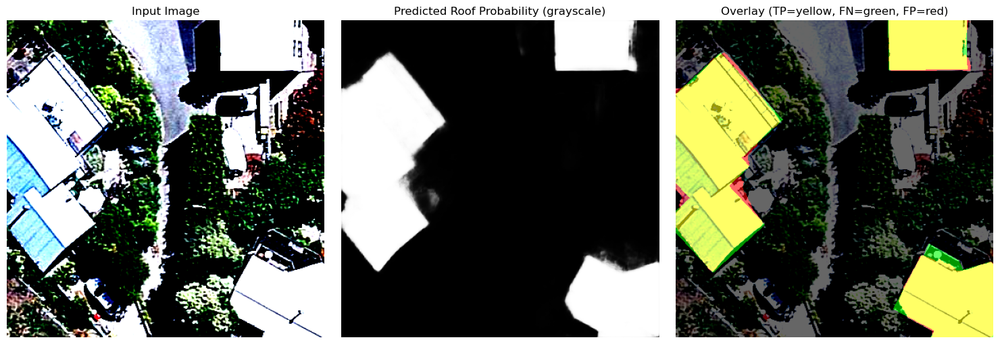

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


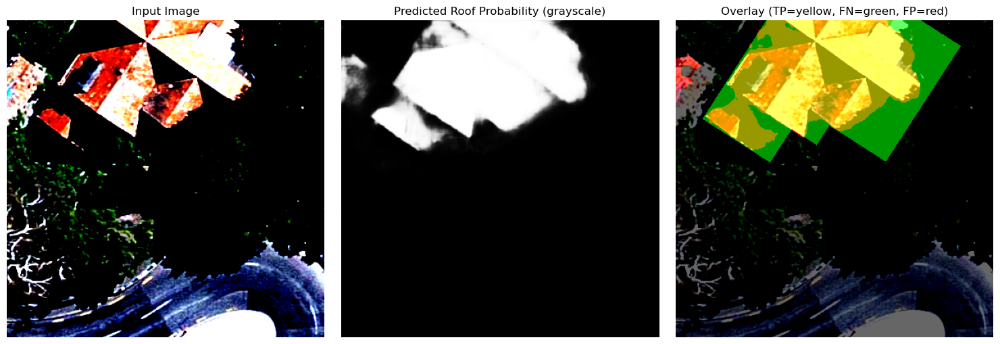

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


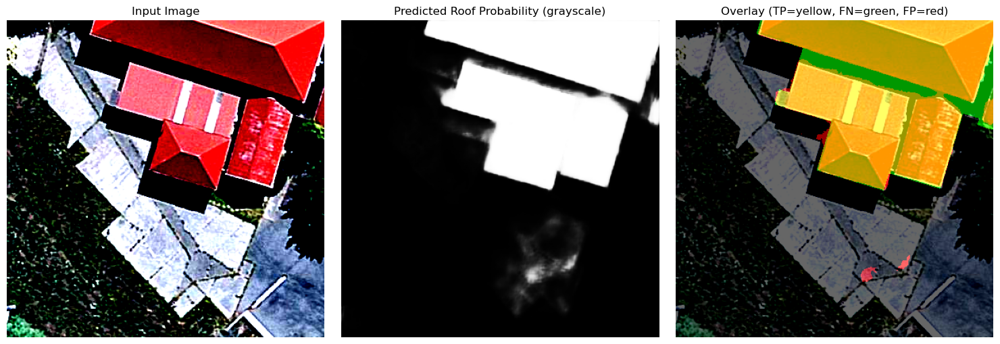

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


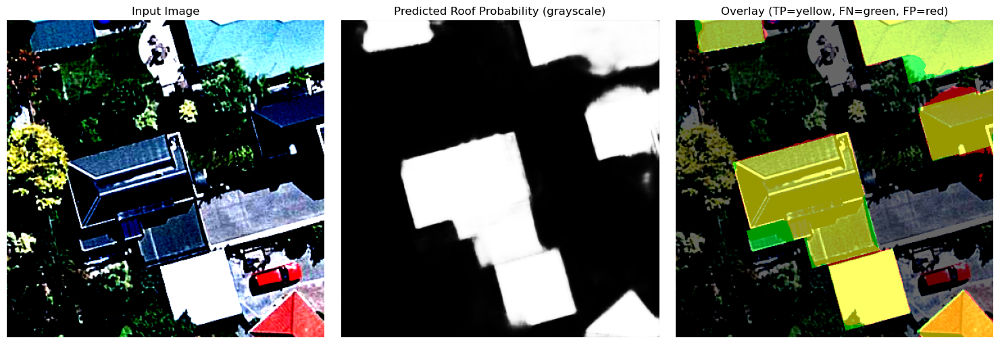

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


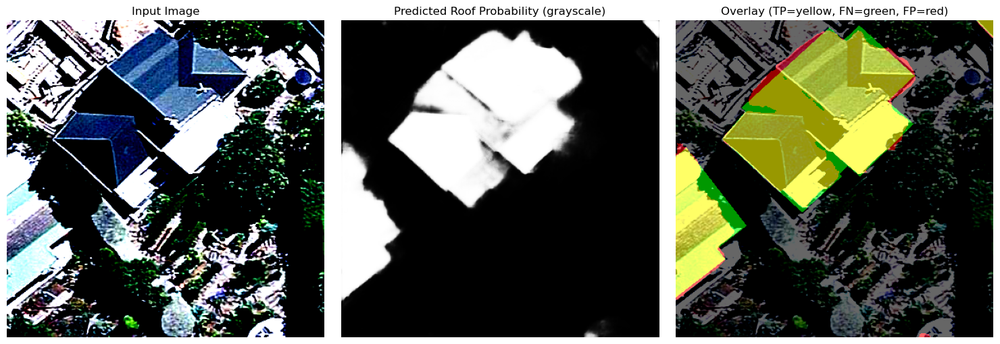

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


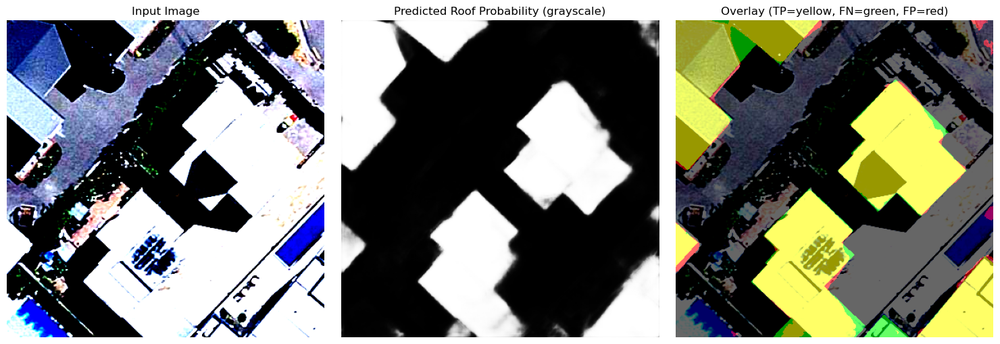

In [23]:
idx = random.sample(range(len(test_dataset)),16)
for idx in idx:

    visualize_grayscale_overlay(model, test_dataset, idx, device=device, overlay=True)



In [25]:
#Test data evaluation
# ---------------------------
model.eval()

@torch.no_grad()
def evaluate_test_metrics(model, loader, threshold=0.5):
    """
    Evaluate test metrics: Dice, IoU, Precision, Recall.
    Args:
        model: trained PyTorch model
        loader: DataLoader for test set
        threshold: probability threshold to binarize masks
    Returns:
        dict of averaged metrics
    """
    model.eval()
    dice_total = 0.0
    iou_total = 0.0
    prec_total = 0.0
    rec_total = 0.0
    n_batches = 0

    for imgs, masks in loader:
        imgs = imgs.to(device)
        masks = masks.to(device)

        outputs = torch.sigmoid(model(imgs))
        preds = (outputs > threshold).float()

        intersection = (preds * masks).sum(dim=(1,2,3))
        union = preds.sum(dim=(1,2,3)) + masks.sum(dim=(1,2,3))
        dice = ((2*intersection + 1e-6) / (union + 1e-6)).mean()

        iou = ((intersection + 1e-6) / ((preds + masks - preds*masks).sum(dim=(1,2,3)) + 1e-6)).mean()
        precision = ((intersection + 1e-6) / (preds.sum(dim=(1,2,3)) + 1e-6)).mean()
        recall = ((intersection + 1e-6) / (masks.sum(dim=(1,2,3)) + 1e-6)).mean()

        dice_total += dice.item()
        iou_total += iou.item()
        prec_total += precision.item()
        rec_total += recall.item()
        n_batches += 1

    metrics = {
        "Dice": dice_total / n_batches,
        "IoU": iou_total / n_batches,
        "Precision": prec_total / n_batches,
        "Recall": rec_total / n_batches
    }

    print("Test metrics:", metrics)
    return metrics


test_metrics = evaluate_test_metrics(model, test_loader)


Test metrics: {'Dice': 0.8602006658911705, 'IoU': 0.793855044990778, 'Precision': 0.8990911208093166, 'Recall': 0.8654430210590363}


## Prediction on aerial images

In [29]:
# Aerial image download function
# ---------------------------
def get_aerial_image_tensor(lat=53.5625, lon=9.9630, zoom=18, size=400, device=None, show=True):
    """
    Download a 400x400 aerial image of a residential area and return as a PyTorch tensor.
    Robust version: retries, zoom fallback, Matplotlib display, auto device selection.

    Args:
        lat, lon : float, center coordinates
        zoom     : int, tile zoom level (17-19 recommended)
        size     : int, final image size (size x size)
        device   : torch device (None auto-selects mps/cuda/cpu)
        show     : bool, whether to display the image

    Returns:
        torch.Tensor of shape (1, 3, size, size), normalized 0-1
        Returns None if tiles cannot be downloaded
    """

    # Select device only when function is called
    if device is None:
        if torch.backends.mps.is_available():
            device = 'mps'
        elif torch.cuda.is_available():
            device = 'cuda'
        else:
            device = 'cpu'

    # Convert lat/lon to tile numbers
    def latlon_to_tile(lat, lon, zoom):
        n = 2 ** zoom
        xtile = (lon + 180.0) / 360.0 * n
        ytile = (1.0 - math.log(math.tan(math.radians(lat)) +
                                1 / math.cos(math.radians(lat))) / math.pi) / 2.0 * n
        return int(math.floor(xtile)), int(math.floor(ytile))

    x, y = latlon_to_tile(lat, lon, zoom)

    # 2x2 tile coordinates
    tiles = [(x, y), (x+1, y), (x, y+1), (x+1, y+1)]
    images = []

    # Download tiles with retries
    for tx, ty in tiles:
        url = f"https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{zoom}/{ty}/{tx}"
        success = False
        for attempt in range(3):
            try:
                resp = requests.get(url, timeout=3)
                resp.raise_for_status()
                img_tile = Image.open(BytesIO(resp.content)).convert('RGB')
                images.append(np.array(img_tile))
                success = True
                break
            except requests.RequestException as e:
                print(f"Attempt {attempt+1} failed for tile {tx},{ty}: {e}")
                time.sleep(0.5)
        if not success:
            if zoom > 17:
                print(f"Falling back to zoom {zoom-1} for tile {tx},{ty}")
                return get_aerial_image_tensor(lat, lon, zoom=zoom-1, size=size, device=device, show=show)
            else:
                print(f"Cannot download tile {tx},{ty}. Returning None.")
                return None

    # Combine tiles into 2x2 grid
    top = np.concatenate([images[0], images[1]], axis=1)
    bottom = np.concatenate([images[2], images[3]], axis=1)
    full_img = np.concatenate([top, bottom], axis=0)

    # Center crop
    start_h = (full_img.shape[0] - size) // 2
    start_w = (full_img.shape[1] - size) // 2
    img_cropped = full_img[start_h:start_h+size, start_w:start_w+size]

   
    # Normalize and convert to tensor
    img_norm = img_cropped / 255.0
    tensor = torch.tensor(img_norm.transpose(2,0,1), dtype=torch.float32).unsqueeze(0).to(device)

    return tensor


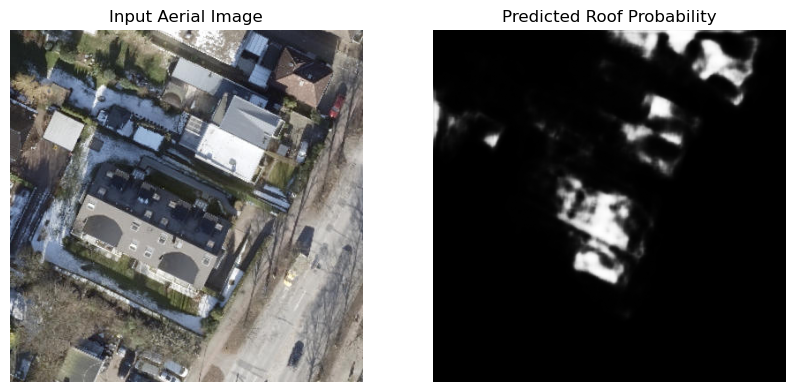

In [36]:
#  Download aerial image
# ---------------------------
img_tensor = get_aerial_image_tensor(
    lat=53.634869813414404,  # center latitude
    lon=10.090849074245684,   # center longitude
    zoom=19,
    size=400,
    device=device,
    show=True     # optional: display input image
)

# Predict roof mask
# ---------------------------
with torch.no_grad():
    logits = model(img_tensor)          # raw outputs
    probs  = torch.sigmoid(logits)      # convert to probabilities
    mask = probs.squeeze().cpu().numpy()  # shape: (H,W)

# Visualize input and predicted mask
# ---------------------------
input_img = img_tensor.squeeze().permute(1,2,0).cpu().numpy() # Convert tensor back to numpy for plotting

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(input_img)
plt.axis('off')
plt.title("Input Aerial Image")

plt.subplot(1,2,2)
plt.imshow(mask, cmap='gray')
plt.axis('off')
plt.title("Predicted Roof Probability")

plt.show()

## Prediction on Sahand's images

In [ ]:
def predict_and_visualize_sahand(model, image_paths, model_size=400, out_size=640, device=device):
    """
    Predict grayscale roof masks for a list of images and visualize results.
    
    Args:
        model       : trained PyTorch segmentation model
        image_paths : list of image file paths (Sahand images, no masks)
        model_size  : int, input size for the model
        out_size    : int, desired output size for visualization
        device      : torch device
    """
    model.eval()
    
    # ImageNet normalization for ResNet encoder
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1).to(device)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1).to(device)
    
    for img_path in image_paths:
        img = Image.open(img_path).convert("RGB")
        img_tensor = TF.to_tensor(img).unsqueeze(0).to(device)  # (1,3,H,W)
        img_tensor = (img_tensor - mean)/std
        
        # Resize input for the model
        img_resized = F.interpolate(img_tensor, size=(model_size, model_size), mode='bilinear', align_corners=False)
        
        # Predict
        with torch.no_grad():
            logits = model(img_resized)
            probs  = torch.sigmoid(logits)
        
        # Resize prediction to original or desired size
        probs_up = F.interpolate(probs, size=(out_size, out_size), mode='bilinear', align_corners=False)
        prob_np = probs_up.squeeze().cpu().numpy()
        
        # ---- Visualization ----
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.title("Input Image")
        plt.axis("off")
        
        plt.subplot(1,2,2)
        plt.imshow(prob_np, cmap="gray")
        plt.title("Predicted Roof Probability")
        plt.axis("off")
        
        plt.show()


In [ ]:
sahand_dir = "/Users/victoriavasilieva/Documents/Projects/Solar_project_Kopie/data/Sahand_img_to_test"  
sahand_images = glob.glob(os.path.join(sahand_dir, "*.jpg"))
print(f"Found {len(sahand_images)} images") 


predict_and_visualize_sahand(model, sahand_images, model_size=400, out_size=640, device=device)